<a href="https://colab.research.google.com/github/naranjitoct/UPCT_IA_2022/blob/main/Prepared_for_exam__04_DeepLearningKerasTheWeather.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1.DEEP LEARNING WITH KERAS
by Ricardo Serón Gracia . Master I4.0 UPCT 2022-2023

Classification exercise for a image dataset with different weather conditions and models

To be listen during the exercise:
https://www.youtube.com/playlist?list=PLzRN-jh85ZxUe55BQvbT-7uhcYxUGlcED

# 2.IMPORTING LIBRARIES AND CONNECTION WITH GOOGLE DRIVE

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import tensorflow
import numpy as np
import seaborn as sns
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.applications import VGG16
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import EfficientNetB7
from keras.applications.efficientnet import  preprocess_input
import random
import os

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Using GDrive as warehouse for our datasets
and counting how many images we have in the different folders/datasets
In our case sunrise has 50 more images than the other and shine some less.

I created the clases list but it will be later inferred from the directories



In [ ]:
#@title Enter Folder route (Copy from left menu): {display-mode: "form"}
gd_folder = "/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest" #@param {type:"string"}


train_dir = gd_folder +'/train'
validation_dir = gd_folder +'/validation'
test_dir = gd_folder +'/test'

clases= ['cloudy','foggy','rainy','shine','sunrise']

for word in clases:

  print('training ', word ,' images:', len(os.listdir(train_dir + "/"+word)))
  print('validation ', word ,' images:', len(os.listdir(validation_dir + "/"+word)))
  print('test ', word ,' images:', len(os.listdir(test_dir + "/"+word)))
  print('----')

training  cloudy  images: 200
validation  cloudy  images: 50
test  cloudy  images: 52
----
training  foggy  images: 200
validation  foggy  images: 50
test  foggy  images: 50
----
training  rainy  images: 200
validation  rainy  images: 50
test  rainy  images: 52
----
training  shine  images: 150
validation  shine  images: 50
test  shine  images: 50
----
training  sunrise  images: 250
validation  sunrise  images: 50
test  sunrise  images: 50
----


#3.REVIEWING OUR DATASET

Two different ways to watch our images (numpy array or keras.preprocessing)

In our example I am using numpy. 

Below how to use Keras.Preprocessing 




```
#  alternative: use keras.preprocessing.image
img_path = '/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/rainy/rain12.jpg' 
img2 = image.load_img(img_path)
img2
```



Finished printing /content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/newcloudy01.jpg


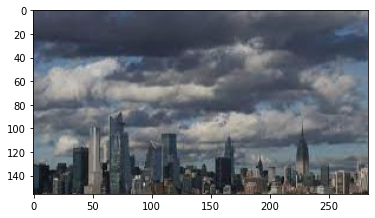

In [ ]:
#@title Enter File Name image to watch it and execute this line: {display-mode: "form"}
fileToWatch_np = "/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/newcloudy01.jpg" #@param {type: "string"}

img=mpimg.imread(fileToWatch_np)
imgplot = plt.imshow(img)

print('Finished printing', fileToWatch_np )

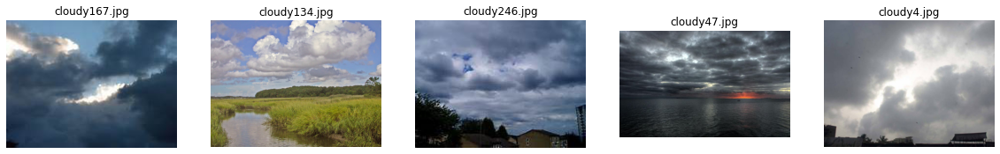

In [ ]:
#@title What classes and dataset you want to check (random images)? {display-mode: "form"}

diri = "cloudy" #@param ["foggy", "cloudy", "rainy", "shine", "sunrise"]
diri2 = "validation" #@param ["test", "train", "validation"]
diri='/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/'+diri2+'/'+diri
plt.figure(figsize=(20,20))

for i in range(5):
    file = random.choice(os.listdir(diri))
    image_path= os.path.join(diri, file)
    imgrgb=mpimg.imread(image_path)
    ax=plt.subplot(1,5,i+1)
    ax.title.set_text(file)
    plt.axis('off')
    plt.imshow(imgrgb)

# 4.CREATE THE 3 DATASETS

- Labels will be inferred from the directories as a integer (so it will be a sparse_categorical). 
- Image will be normalized to 150x150 ( If some test are needed I could make them as params )  (height, width)
- Data will be suffer (exception: test data set)
- Batch size = 16. This number represents how many img will be used to train the model before to update the model.
- Rgb is used so we will build 4 dimension TF

If  Y are one-hot encoded, use categorical_crossentropy. Examples 3-class classification): [1,0,0] , [0,1,0], [0,0,1]

If Y are integers, use sparse_categorical_crossentropy. Examples 3-class classification problem: [1] , [2], [3]

Further details in : https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory

In [ ]:
train_dataset = image_dataset_from_directory(
    train_dir , 
    labels="inferred", # default: inferred from dir structure
    label_mode="int", # default 
    seed=41,
    image_size=(150, 150),
    shuffle=True, # default
    color_mode="rgb", # default
    batch_size=16)

validation_dataset = image_dataset_from_directory(
    validation_dir , 
    labels="inferred", # default: inferred from dir structure
    label_mode="int", # default
    seed=41,
    image_size=(150, 150),
    shuffle=True, # default
    color_mode="rgb", # default
    batch_size=16)

test_dataset = image_dataset_from_directory(
    test_dir , 
    labels="inferred", # default: inferred from dir structure
    label_mode="int", # default
    seed=41,
    image_size=(150, 150),
    shuffle=False, # default
    color_mode="rgb", # default
    batch_size=16)

Found 1000 files belonging to 5 classes.
Found 250 files belonging to 5 classes.
Found 254 files belonging to 5 classes.


In [ ]:
#Testing purpose. Obviosuly they are all the same. A list of the 5 classes (['cloudy', 'foggy', 'rainy', 'shine', 'sunrise'])
#print(test_dataset.class_names)
#print(validation_dataset.class_names)
#print(train_dataset.class_names)

Copied from the original colab book. It is not necessary. Just only to review the 4 dimension TF than will be created + 2 ( heigh and width).

In [ ]:
for data_batch, labels_batch in train_dataset:
  print("data_batch shape:", data_batch.shape)
  print("labels_batch shape:", labels_batch.shape)
  break

print('\ndatabatch is a ', data_batch.dtype) #tf.float32

data_batch shape: (16, 150, 150, 3)
labels_batch shape: (16,)

databatch is a  <dtype: 'float32'>


# 5.CONFIGURING  CNN MODELS

- I will use VGG16.I am not including 3 top layers . I will train later. 
- I will use EfficientNetB7.I am not including 3 top layers . 
- I will use "normal" CNN.

Last layer will not be added or 1000 classes classification from imagenet will be needed and I want to train with our dataset



In [ ]:
#@title What model do you want to train? {display-mode: "form"}
model_selectable = "All" #@param ["CNN", "VGG16", "Efficient", "All"]

In [ ]:
if (model_selectable == "Efficient") or (model_selectable == "All") :
  conv_base2 = EfficientNetB7(
      include_top=False,
      weights="imagenet",
      input_shape=(150, 150, 3),
      classes=5,
      classifier_activation="softmax")
  print('Efficient OK')


if (model_selectable == "VGG16") or (model_selectable == "All") :
  conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))
  print('VGG16 OK')



258076736/258076736 [==============================] - 12s 0us/step
Efficient OK
58889256/58889256 [==============================] - 3s 0us/step
VGG16 OK


Only last layer will be trained (for Efficient & VGG16) so trainable weights will be frozen;

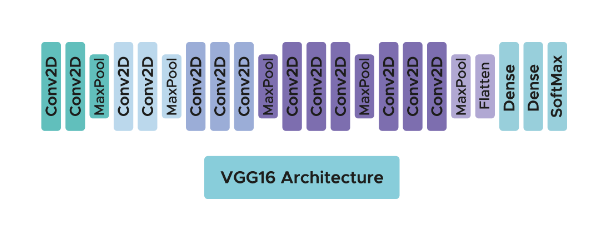

In [ ]:
if (model_selectable == "VGG16") or (model_selectable == "All") :
  print(conv_base.summary())
  #EfficientNet (709 params)
  conv_base2.trainable = False

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [ ]:
if (model_selectable == "Efficient") or (model_selectable == "All") :
  print(conv_base2.summary())
  #Freeze for VGG16 (26 params)
  conv_base.trainable = False

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 150, 150, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 150, 150, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 150, 150, 3)  0           ['normalization[0][0

In [ ]:
#Not modified from the class colab book

if (model_selectable == "Efficient") or (model_selectable == "VGG16") or(model_selectable == "All") :
  data_augmentation = keras.Sequential(
      [
          keras.layers.RandomFlip("horizontal"),
          # keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
          # keras.layers.RandomContrast(factor=0.1),
          keras.layers.RandomRotation(0.1),
          keras.layers.RandomZoom(0.2),
      ]
  )
  print('dataAugmentation Done')

dataAugmentation Done


❗Don't forget to reset keras session before to retest.

In [ ]:
# del model # from previous fits if requiered, or better: 
tensorflow.keras.backend.clear_session()
tensorflow.random.set_seed(123)
np.random.seed(123)

In [ ]:
if (model_selectable == "VGG16") or(model_selectable == "All") :
  inputs = keras.Input(shape=(150, 150, 3))
  x = data_augmentation(inputs)
  # x = keras.layers.Rescaling(scale=1./255)(x) # do not scale, because:
  # Input to preprocesss_input should be a float np.array or tf.Tensor,
  # 3D or 4D with 3 color channels, with values in the range [0, 255]
  x = keras.applications.vgg16.preprocess_input(x)
  x = conv_base(x)
  x = keras.layers.Flatten()(x)
  x = keras.layers.Dense(256)(x)
  x = keras.layers.Dropout(0.5)(x)
  outputs = keras.layers.Dense(5, activation="softmax")(x)
  modelVGG = keras.Model(inputs, outputs)

  optimizer = keras.optimizers.Adam(learning_rate=0.001)

  modelVGG.compile(loss='sparse_categorical_crossentropy',
                optimizer=optimizer,
                metrics=["sparse_categorical_accuracy"])
  
  print(modelVGG.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 150, 150, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 150, 150, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                             

In [ ]:
if (model_selectable == "Efficient") or(model_selectable == "All") :
  inputs2 = keras.Input(shape=(150, 150, 3))
  x2 = data_augmentation(inputs2)
  # x = keras.layers.Rescaling(scale=1./255)(x) # do not scale, because:
  # Input to preprocesss_input should be a float np.array or tf.Tensor,
  # 3D or 4D with 3 color channels, with values in the range [0, 255]
  x2 = keras.applications.efficientnet.preprocess_input(x2)
  x2 = conv_base2(x2)
  x2 = keras.layers.Flatten()(x2)
  x2 = keras.layers.Dense(256)(x2)
  x2 = keras.layers.Dropout(0.5)(x2)
  outputs2 = keras.layers.Dense(5, activation="softmax")(x2)
  modelEff = keras.Model(inputs2, outputs2)

  optimizer = keras.optimizers.Adam(learning_rate=0.001)

  modelEff.compile(loss='sparse_categorical_crossentropy',
                optimizer=optimizer,
                metrics=["sparse_categorical_accuracy"])
  print(modelEff.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 efficientnetb7 (Functional)  (None, 5, 5, 2560)       64097687  
                                                                 
 flatten_1 (Flatten)         (None, 64000)             0         
                                                                 
 dense_2 (Dense)             (None, 256)               16384256  
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 5)                 1285

In [ ]:
if (model_selectable == "CNN") or(model_selectable == "All") :

  num_classes = len(train_dataset.class_names) #5 classes in our example: ['cloudy', 'foggy', 'rainy', 'shine', 'sunrise']

  modelCNN = keras.models.Sequential() #Create the model and add Sequential layers

  modelCNN.add(keras.layers.Rescaling(1./255,input_shape=[150, 150, 3]))
  modelCNN.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", activation="relu"))
  modelCNN.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", activation="relu"))
  modelCNN.add(keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))

  modelCNN.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding="same", activation="relu"))
  modelCNN.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding="same", activation="relu"))
  modelCNN.add(keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))

  modelCNN.add(keras.layers.Flatten())

  modelCNN.add(keras.layers.Dense(units=128, activation='relu'))
  modelCNN.add(keras.layers.Dense(units=num_classes, activation='softmax'))

  optimizer = keras.optimizers.Adam(learning_rate=0.001)

  modelCNN.compile(loss='sparse_categorical_crossentropy',
                optimizer=optimizer,
                metrics=["sparse_categorical_accuracy"])

  print(modelCNN.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 75, 75, 64)        36928     
                                                        

In [ ]:
callbacksEFF = [
    keras.callbacks.ModelCheckpoint( # Use ModelCheckpoint to monitor when the model improves
        filepath="weatherEff-ep{epoch:03d}-vacc{sparse_categorical_accuracy:.3f}-loss{loss:.3f}.hdf5",
        save_best_only=True,
        monitor="val_loss"
    ),

    keras.callbacks.TensorBoard( # Use TensorBoard to monitor the training process
        log_dir="./tensorboard_logs",
        histogram_freq=1,
        write_graph=True,
        write_images=True,
    )
]

callbacksVGG = [
    keras.callbacks.ModelCheckpoint( # Use ModelCheckpoint to monitor when the model improves
        filepath="weatherVgg-ep{epoch:03d}-vacc{sparse_categorical_accuracy:.3f}-loss{loss:.3f}.hdf5",
        save_best_only=True,
        monitor="val_loss"
    ),

    keras.callbacks.TensorBoard( # Use TensorBoard to monitor the training process
        log_dir="./tensorboard_logs",
        histogram_freq=1,
        write_graph=True,
        write_images=True,
    )
]

callbacksCNN = [
    keras.callbacks.ModelCheckpoint( # Use ModelCheckpoint to monitor when the model improves
        filepath="weatherCNN-ep{epoch:03d}-vacc{sparse_categorical_accuracy:.3f}-loss{loss:.3f}.hdf5",
        save_best_only=True,
        monitor="val_loss"
    ),

    keras.callbacks.TensorBoard( # Use TensorBoard to monitor the training process
        log_dir="./tensorboard_logs",
        histogram_freq=1,
        write_graph=True,
        write_images=True,
    )
]

In [ ]:
# remove any model from previous fits: 
if (model_selectable == "CNN") or(model_selectable == "All") :
  !rm *CNN*.hdf5
if (model_selectable == "VGG") or(model_selectable == "All") :
  !rm *VGG*.hdf5
if (model_selectable == "Efficient") or(model_selectable == "All") :
  !rm *VGG*.hdf5

rm: cannot remove '*CNN*.hdf5': No such file or directory
rm: cannot remove '*VGG*.hdf5': No such file or directory
rm: cannot remove '*VGG*.hdf5': No such file or directory


In [ ]:
# Load the TensorBoard notebook extension 
# WARNING: NO SPACES OR COMMENTS AT THE END OF THE SENTENCE!!!!
%reload_ext tensorboard

❗January2023: Third party cookies should be enable for this widget.

Privacy setting ... Cookies... Allow all or Block 3rd in Incognit

In [ ]:
# Launch TensorBoard with the specified log directory
%tensorboard --logdir "./tensorboard_logs"

<IPython.core.display.Javascript object>

**It takes about 15-30 min to complete (with GPU)**

Best models should be in the 10 first epochs... 
But from time to time some others appears (with any significant variation)

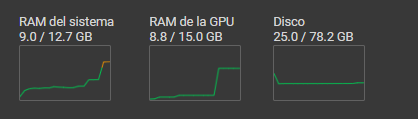

In [ ]:
epoch_Eff = 20 #@param {type:"slider", min:0, max:100, step:1, value:20}

#MODEL with Efficientnet. Epochs selectable (20 epochs by default)

if (model_selectable == "Efficient") or(model_selectable == "All") :

  historyEff = modelEff.fit(
            train_dataset,
            epochs=epoch_Eff,  
            validation_data=validation_dataset,
            callbacks=callbacksEFF
            )

Epoch 1/20
63/63 [==============================] - 420s 6s/step - loss: 28.5846 - sparse_categorical_accuracy: 0.6280 - val_loss: 12.8729 - val_sparse_categorical_accuracy: 0.8040
Epoch 2/20
63/63 [==============================] - 51s 809ms/step - loss: 16.4254 - sparse_categorical_accuracy: 0.7840 - val_loss: 6.9119 - val_sparse_categorical_accuracy: 0.8880
Epoch 3/20
63/63 [==============================] - 48s 771ms/step - loss: 10.6660 - sparse_categorical_accuracy: 0.8430 - val_loss: 9.7385 - val_sparse_categorical_accuracy: 0.8760
Epoch 4/20
63/63 [==============================] - 48s 763ms/step - loss: 10.2351 - sparse_categorical_accuracy: 0.8630 - val_loss: 7.9193 - val_sparse_categorical_accuracy: 0.8920
Epoch 5/20
63/63 [==============================] - 53s 848ms/step - loss: 8.6544 - sparse_categorical_accuracy: 0.8630 - val_loss: 7.6873 - val_sparse_categorical_accuracy: 0.8880
Epoch 6/20
63/63 [==============================] - 50s 797ms/step - loss: 8.7220 - sparse_c

In [ ]:
#@title Enter File Name to be copied below and execute this line: {display-mode: "form"}
fileToCopy = "/content/weatherEff-ep014-vacc0.910-loss5.983.hdf5" #@param {type: "string"}


!cp $fileToCopy \
"./gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/Efficient"

print('Finished')

Finished


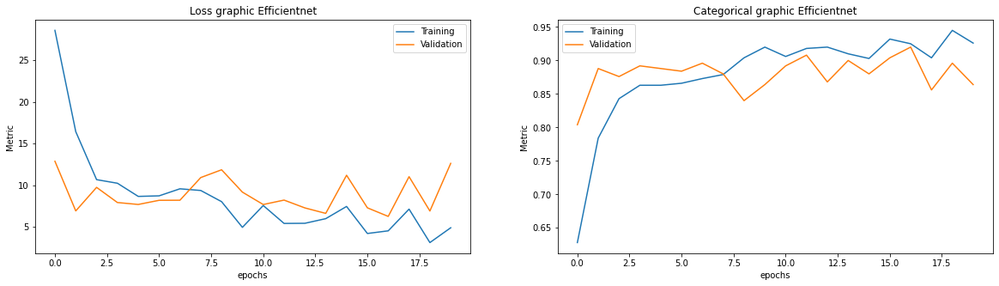

In [ ]:
fig, (ax1, ax2 ) = plt.subplots(1,2, figsize=(20,5))

ax1.plot(historyEff.history['loss'], label='Training loss')
ax1.plot(historyEff.history['val_loss'], label='Validation loss')
ax1.set(title="Loss graphic Efficientnet", xlabel="epochs", ylabel="Metric")
ax1.legend(['Training', 'Validation'])

ax2.plot(historyEff.history['sparse_categorical_accuracy'], label='Training')
ax2.plot(historyEff.history['val_sparse_categorical_accuracy'], label='Validation')
ax2.set(title="Categorical graphic Efficientnet", xlabel="epochs", ylabel="Metric")
ax2.legend(['Training', 'Validation'])


In [ ]:
# Be aware before to delete all fits models previosly to be uploaded
#!rm *.hdf5

20 epochs in VGG with GPU is about 5 minutes

In [ ]:
epoch_VGG = 20 #@param {type:"slider", min:0, max:100, step:1, value:20}

#fit the MODEL with VGG16
historyVGG = modelVGG.fit(
          train_dataset,
          epochs=epoch_VGG,  
          validation_data=validation_dataset,
          callbacks=callbacksVGG 
          )

Epoch 1/20
63/63 [==============================] - 16s 195ms/step - loss: 7.0248 - sparse_categorical_accuracy: 0.8000 - val_loss: 4.8145 - val_sparse_categorical_accuracy: 0.9000
Epoch 2/20
63/63 [==============================] - 11s 164ms/step - loss: 5.8125 - sparse_categorical_accuracy: 0.8760 - val_loss: 5.7422 - val_sparse_categorical_accuracy: 0.9080
Epoch 3/20
63/63 [==============================] - 10s 151ms/step - loss: 4.2878 - sparse_categorical_accuracy: 0.9210 - val_loss: 8.4046 - val_sparse_categorical_accuracy: 0.8920
Epoch 4/20
63/63 [==============================] - 9s 141ms/step - loss: 2.9483 - sparse_categorical_accuracy: 0.9340 - val_loss: 6.8964 - val_sparse_categorical_accuracy: 0.9080
Epoch 5/20
63/63 [==============================] - 12s 185ms/step - loss: 3.7691 - sparse_categorical_accuracy: 0.9360 - val_loss: 6.0426 - val_sparse_categorical_accuracy: 0.8960
Epoch 6/20
63/63 [==============================] - 12s 184ms/step - loss: 3.1014 - sparse_categ

In [ ]:
#@title Enter File Name to be copied below and execute this line: {display-mode: "form"}
fileToCopy = "/content/weatherVgg-ep001-vacc0.800-loss7.025.hdf5" #@param {type: "string"}


!cp $fileToCopy \
"./gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/VGG16"

print('Finished')

Finished


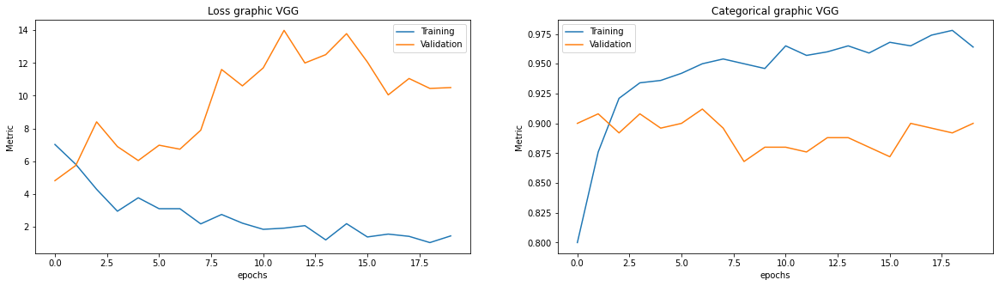

In [ ]:
fig, (ax1, ax2 ) = plt.subplots(1,2, figsize=(20,5))

ax1.plot(historyVGG.history['loss'], label='Training loss')
ax1.plot(historyVGG.history['val_loss'], label='Validation loss')
ax1.set(title="Loss graphic VGG", xlabel="epochs", ylabel="Metric")
ax1.legend(['Training', 'Validation'])

ax2.plot(historyVGG.history['sparse_categorical_accuracy'], label='Training')
ax2.plot(historyVGG.history['val_sparse_categorical_accuracy'], label='Validation')
ax2.set(title="Categorical graphic VGG", xlabel="epochs", ylabel="Metric")
ax2.legend(['Training', 'Validation'])


In [ ]:
# Be aware before to delete all fits models previosly to be uploaded
#!rm *.hdf5

20 epochs in CNN with GPU is about 5 minutes. It is not worth to calculate too much. I am doing as I chose the final model but it will be overfitted.

In [ ]:
epoch_CNN = 54 #@param {type:"slider", min:0, max:500, step:1, value:100}

#fit the MODEL with VGG16
historyCNN = modelCNN.fit(
          train_dataset,
          epochs=epoch_CNN,  
          validation_data=validation_dataset,
          callbacks=callbacksCNN
          )

Epoch 1/54
63/63 [==============================] - 10s 161ms/step - loss: 0.1226 - sparse_categorical_accuracy: 0.9580 - val_loss: 0.7896 - val_sparse_categorical_accuracy: 0.7640
Epoch 2/54
63/63 [==============================] - 9s 143ms/step - loss: 0.1301 - sparse_categorical_accuracy: 0.9530 - val_loss: 1.0972 - val_sparse_categorical_accuracy: 0.7640
Epoch 3/54
63/63 [==============================] - 9s 130ms/step - loss: 0.1539 - sparse_categorical_accuracy: 0.9480 - val_loss: 0.8622 - val_sparse_categorical_accuracy: 0.8000
Epoch 4/54
63/63 [==============================] - 10s 144ms/step - loss: 0.1114 - sparse_categorical_accuracy: 0.9600 - val_loss: 1.0686 - val_sparse_categorical_accuracy: 0.7600
Epoch 5/54
63/63 [==============================] - 10s 148ms/step - loss: 0.0834 - sparse_categorical_accuracy: 0.9740 - val_loss: 1.0836 - val_sparse_categorical_accuracy: 0.7440
Epoch 6/54
63/63 [==============================] - 9s 135ms/step - loss: 0.1019 - sparse_categor

In [ ]:
#@title Enter File Name to be copied below and execute this line: {display-mode: "form"}
fileToCopy = "/content/weatherCNN-ep001-vacc0.958-loss0.123.hdf5" #@param {type: "string"}


!cp $fileToCopy \
"./gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/CNN"

print('Finished')

Finished


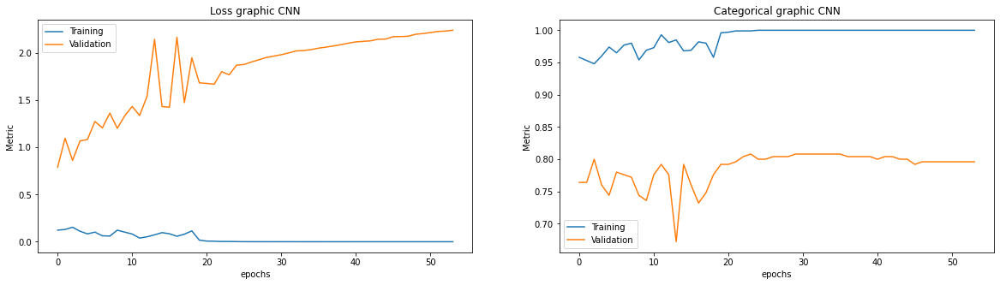

In [ ]:
fig, (ax1, ax2 ) = plt.subplots(1,2, figsize=(20,5))

ax1.plot(historyCNN.history['loss'], label='Training loss')
ax1.plot(historyCNN.history['val_loss'], label='Validation loss')
ax1.set(title="Loss graphic CNN", xlabel="epochs", ylabel="Metric")
ax1.legend(['Training', 'Validation'])

ax2.plot(historyCNN.history['sparse_categorical_accuracy'], label='Training')
ax2.plot(historyCNN.history['val_sparse_categorical_accuracy'], label='Validation')
ax2.set(title="Categorical graphic CNN", xlabel="epochs", ylabel="Metric")
ax2.legend(['Training', 'Validation'])


# 6.LOAD EVALUATION MODEL FILE TO TRY WITH TEST_DATASET

In [ ]:
#@title Enter File Name to be EVALUATED below and execute this line: {display-mode: "form"}
if (model_selectable == "VGG") or(model_selectable == "All") :
  fileToEvaluate_VGG = "/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/VGG16/weatherVgg-ep001-vacc0.800-loss7.025.hdf5" #@param {type: "string"}
  best_modelVGG = keras.models.load_model(fileToEvaluate_VGG)
  best_model_loss_VGG, best_model_acc_VGG = best_modelVGG.evaluate(test_dataset) # evaluate on the test_dataset
  print(f"best_model accuracy_vgg: {best_model_acc_VGG:.3f}")

  
if (model_selectable == "Efficient") or(model_selectable == "All") :
  fileToEvaluate_EFF = "/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/Efficient/weatherEff-ep014-vacc0.910-loss5.983.hdf5" #@param {type: "string"}
  best_modelEFF = keras.models.load_model(fileToEvaluate_EFF)
  best_model_loss_EFF, best_model_acc_EFF = best_modelEFF.evaluate(test_dataset) # evaluate on the test_dataset
  print(f"best_model accuracy_Eff: {best_model_acc_EFF:.3f}")


if (model_selectable == "CNN") or(model_selectable == "All") :
  fileToEvaluate_CNN = "/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/Best_models/CNN/weatherCNN-ep001-vacc0.958-loss0.123.hdf5" #@param {type: "string"}
  best_modelCNN = keras.models.load_model(fileToEvaluate_CNN)
  best_model_loss_CNN, best_model_acc_CNN = best_modelCNN.evaluate(test_dataset) # evaluate on the test_dataset
  print(f"best_model accuracy_CNN: {best_model_acc_CNN:.3f}")

16/16 [==============================] - 102s 6s/step - loss: 6.4395 - sparse_categorical_accuracy: 0.8819
best_model accuracy_vgg: 0.882
16/16 [==============================] - 9s 191ms/step - loss: 6.5236 - sparse_categorical_accuracy: 0.9252
best_model accuracy_Eff: 0.925
16/16 [==============================] - 3s 132ms/step - loss: 1.0805 - sparse_categorical_accuracy: 0.7323
best_model accuracy_CNN: 0.732


Extract all the batches in the training dataset to group them (concatenate) in the next step.

In [ ]:
data_batch_list = []
labels_batch_list = []
for data_batch, labels_batch in test_dataset: # let's evaluate on the test_dataset
    #print("data_batch shape:", data_batch.shape)
    #print("labels_batch shape:", labels_batch.shape)
    data_batch_list.append(data_batch)
    labels_batch_list.append(labels_batch)

... so our dataset is in a good original dimensions (X's-photo and Y's-labels)

X = (number of photos, heigh, width, layer (3 in rgb) ) = DATA

Y = number of photos = LABEL

In [ ]:
x_test = np.concatenate(data_batch_list) # concatenates a sequence (or list) of arrays 
y_test = np.concatenate(labels_batch_list) # concatenates a sequence (or list) of arrays
print(x_test.shape)
print(y_test.shape)

(254, 150, 150, 3)
(254,)


Prediction Dimension is (number_of_files, number_of_classes)

In [ ]:
if (model_selectable == "VGG") or(model_selectable == "All") :
  y_pred_proba_VGG = best_modelVGG.predict(x_test) # get predictions from the model VGG
  
if (model_selectable == "Efficient") or(model_selectable == "All") :
  y_pred_proba_EFF = best_modelEFF.predict(x_test) # get predictions from the model EfficientNet

if (model_selectable == "CNN") or(model_selectable == "All") :
  y_pred_proba_CNN = best_modelCNN.predict(x_test) # get predictions from the model CCN

#print(y_pred_proba_EFF.shape) #number of photos x 5 categories

8/8 [==============================] - 1s 68ms/step


In [ ]:
# Just in the case we want to check probability arrays.
# but model.predict returns a probability, not a class  let's print the first 10 predictions

np.set_printoptions(formatter={'float': lambda x: "{0:0.1f}".format(x)})

print('MODEL PREDICTIONS (in %)')

for i in range(10):
  print ('\nImage',i)
  print('  VGG',y_pred_proba_VGG[i]*100)
  print('  EFF',y_pred_proba_EFF[i]*100)
  print('  CNN',y_pred_proba_CNN[i]*100)

MODEL PREDICTIONS (in %)

Image 0
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [1.3 1.1 1.5 96.1 0.0]

Image 1
  VGG [0.0 0.0 0.0 100.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [0.0 0.0 0.0 100.0 0.0]

Image 2
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [89.5 7.9 2.6 0.0 0.0]

Image 3
  VGG [0.0 0.0 0.0 100.0 0.0]
  EFF [0.0 0.0 0.0 53.2 46.8]
  CNN [0.3 1.0 0.1 98.4 0.2]

Image 4
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [81.5 0.3 0.3 17.9 0.0]

Image 5
  VGG [0.0 0.0 0.0 100.0 0.0]
  EFF [0.0 0.0 0.0 100.0 0.0]
  CNN [0.7 0.1 0.0 99.2 0.0]

Image 6
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [0.5 0.2 0.0 99.3 0.0]

Image 7
  VGG [0.0 0.0 0.0 100.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [0.1 0.0 0.0 99.9 0.0]

Image 8
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [7.3 0.0 0.0 92.7 0.0]

Image 9
  VGG [100.0 0.0 0.0 0.0 0.0]
  EFF [100.0 0.0 0.0 0.0 0.0]
  CNN [99.2 0.7 0.2 0.

In [ ]:
# Max probability defines what classes the picture belong to... and flat it.

if (model_selectable == "VGG") or(model_selectable == "All") :
  y_pred_VGG = y_pred_proba_VGG.argmax(axis=1) 

if (model_selectable == "Efficient") or(model_selectable == "All") :
  y_pred_EFF = y_pred_proba_EFF.argmax(axis=1) 

if (model_selectable == "CNN") or(model_selectable == "All") :
  y_pred_CNN = y_pred_proba_CNN.argmax(axis=1) 


In [ ]:
# first 10 predicted labels . We could add a funtion to check only different y_pred values

print('MODEL PREDICTIONS (value)')

for i in range(10):
  print ('\nImage',i)
  print('    VGG',y_pred_VGG[i])
  print('    EFF',y_pred_EFF[i])
  print('    CNN',y_pred_CNN[i])

MODEL PREDICTIONS (value)

Image 0
    VGG 0
    EFF 0
    CNN 3

Image 1
    VGG 3
    EFF 0
    CNN 3

Image 2
    VGG 0
    EFF 0
    CNN 0

Image 3
    VGG 3
    EFF 3
    CNN 3

Image 4
    VGG 0
    EFF 0
    CNN 0

Image 5
    VGG 3
    EFF 3
    CNN 3

Image 6
    VGG 0
    EFF 0
    CNN 3

Image 7
    VGG 3
    EFF 0
    CNN 3

Image 8
    VGG 0
    EFF 0
    CNN 3

Image 9
    VGG 0
    EFF 0
    CNN 0


#7.METRIX AND MATRIX ... AMAZING !!

In [ ]:
if (model_selectable == "VGG") or(model_selectable == "All") :
  print('\n-------------VGG DATA-----------------------')
  print(confusion_matrix(y_test, y_pred_VGG))
  print('\n------------------------------------')
  print(classification_report(y_test, y_pred_VGG))
  print('\n------------------------------------')
  print("General Accuracy VGG score:", accuracy_score(y_test, y_pred_VGG))  

if (model_selectable == "Efficient") or(model_selectable == "All") :
  print('\n-------------Efficient DATA-----------------------')
  print(confusion_matrix(y_test, y_pred_EFF))
  print('\n------------------------------------')
  print(classification_report(y_test, y_pred_EFF))
  print('\n------------------------------------')
  print("General Accuracy Efficient score:", accuracy_score(y_test, y_pred_EFF))  

if (model_selectable == "CNN") or(model_selectable == "All") :
  print('\n-------------CNN DATA-----------------------')
  print(confusion_matrix(y_test, y_pred_CNN))
  print('\n------------------------------------')
  print(classification_report(y_test, y_pred_CNN))
  print('\n------------------------------------')
  print("General Accuracy CNN score:", accuracy_score(y_test, y_pred_CNN))
    



-------------VGG DATA-----------------------
[[45  1  0  6  0]
 [ 0 41  2  6  1]
 [ 0  3 49  0  0]
 [ 2  1  0 43  4]
 [ 0  3  0  1 46]]

------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.87      0.91        52
           1       0.84      0.82      0.83        50
           2       0.96      0.94      0.95        52
           3       0.77      0.86      0.81        50
           4       0.90      0.92      0.91        50

    accuracy                           0.88       254
   macro avg       0.88      0.88      0.88       254
weighted avg       0.89      0.88      0.88       254


------------------------------------
General Accuracy VGG score: 0.8818897637795275

-------------Efficient DATA-----------------------
[[47  2  0  3  0]
 [ 0 46  3  0  1]
 [ 0  2 50  0  0]
 [ 3  0  0 47  0]
 [ 1  2  0  2 45]]

------------------------------------
              precision    recall  f1-score   support

           0   

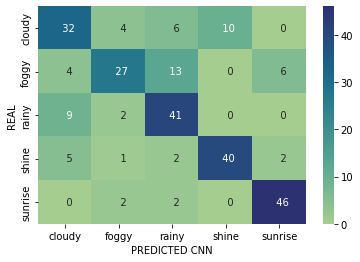

In [ ]:
plt.figure(figsize=(6, 4))

if (model_selectable == "CNN") or(model_selectable == "All") :
  ax = sns.heatmap(confusion_matrix(y_test, y_pred_CNN), 
            annot=True, 
            fmt='4d',  
            xticklabels=train_dataset.class_names, 
            yticklabels=train_dataset.class_names,
            cmap="crest"
            )
  ax.set(xlabel="PREDICTED CNN", ylabel="REAL")
  #ax.xaxis.tick_top()

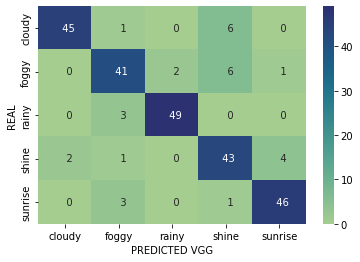

In [ ]:
plt.figure(figsize=(6, 4))
if (model_selectable == "VGG") or(model_selectable == "All") :
  ax2 = sns.heatmap(confusion_matrix(y_test, y_pred_VGG), 
            annot=True, 
            fmt='4d',  
            xticklabels=train_dataset.class_names, 
            yticklabels=train_dataset.class_names,
            cmap="crest"
            )
  ax2.set(xlabel="PREDICTED VGG", ylabel="REAL")
  #ax.xaxis.tick_top()

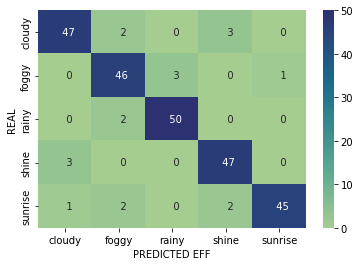

In [ ]:
plt.figure(figsize=(6, 4))
if (model_selectable == "Efficient") or(model_selectable == "All") :
  ax1 = sns.heatmap(confusion_matrix(y_test, y_pred_EFF), 
            annot=True, 
            fmt='4d',  
            xticklabels=train_dataset.class_names, 
            yticklabels=train_dataset.class_names,
            cmap="crest"
            )
  ax1.set(xlabel="PREDICTED EFF", ylabel="REAL")
  #ax.xaxis.tick_top()

#8.SELECT SOME IMAGES TO BE PREDICTED WITH THE MODEL. ANALIZYNG FAILURES IN IMAGES

Let's find which predictions have failed. Nothing is perfect...

Test dataset has not been shuffled for a better visualization

In [ ]:
if (model_selectable == "CNN") or(model_selectable == "All") :
  print(y_pred_CNN)
  print('-----------')

if (model_selectable == "VGG") or(model_selectable == "All") :
  print(y_pred_VGG)
  print('-----------')
  
if (model_selectable == "Efficient") or(model_selectable == "All") :
  print(y_pred_EFF)
  print('-----------')


print(y_test)


[3 3 0 3 0 3 3 3 3 0 2 0 0 2 0 0 0 0 1 2 0 0 2 0 3 0 0 0 1 1 0 0 1 0 0 0 0
 0 0 0 2 0 0 0 0 0 3 0 0 3 0 2 1 1 2 0 1 1 1 4 4 1 1 2 1 1 1 1 0 1 2 2 1 2
 4 1 1 1 1 2 2 1 2 4 1 0 1 1 1 1 1 1 1 2 4 2 2 2 1 4 0 2 1 2 2 2 2 2 2 2 2
 2 2 0 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 0 2 0 2 2 2 2 2 0 2 2 2 2 0 2 2 2 2 2
 0 0 0 2 2 0 0 3 3 3 1 3 4 0 3 3 0 3 3 3 3 3 3 3 4 3 3 3 3 3 3 0 3 3 3 3 2
 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 0 4 4 4 4 2 2 4 4 4 4 4 4 4 4 4 1 4 1
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]
-----------
[0 3 0 3 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 3 1 1 3 1 4 1 1 1 1 1 1 1 1 1 1 3 1 1 1
 1 1 1 1 1 3 2 1 1 1 1 3 1 1 1 1 3 1 1 2 1 1 1 1 1 1 1 1 2 2 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 3 3 3 3 4 3 3 3 3 3 0 3 4 1 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 3 3
 3 3 3 3 0 3 3 4 3 3 3 3 3 3 3 3 3 3 3 4 3 4 1 4 4 4 4 4 4 4 4 4 4 4 1 4 4
 4 4 4 4 4 4 4 4 4 4 4

As reference of the previous arrays
- 0 'cloudy',
- 1 'foggy',
- 2 'rainy',
- 3 'shine',
- 4 'sunrise'

This is the position of the failed images.

In [ ]:
if (model_selectable == "CNN") or(model_selectable == "All") :
  print('\n-----CNN Errors------')
  errores_CNN=y_test-y_pred_CNN
  error_position_CNN=np.where(errores_CNN != 0)[0]
  print(error_position_CNN)

if (model_selectable == "VGG") or(model_selectable == "All") :
  print('\n-----VGG Errors------')
  errores_VGG=y_test-y_pred_VGG
  error_position_VGG=np.where(errores_VGG != 0)[0]
  print(error_position_VGG)
  
if (model_selectable == "Efficient") or(model_selectable == "All") :
  print('\n-----EfficientNet Errors------')
  errores_EFF=y_test-y_pred_EFF
  error_position_EFF=np.where(errores_EFF != 0)[0]
  print(error_position_EFF)


-----CNN Errors------
[  0   1   3   5   6   7   8  10  13  18  19  22  24  28  29  32  40  46
  49  51  54  55  59  60  63  68  70  71  73  74  79  80  82  83  85  93
  94  95  96  97  99 100 101 102 113 121 129 131 137 142 148 149 150 153
 154 158 160 161 164 172 179 184 198 203 208 209 219 221]

-----VGG Errors------
[  1   3   5   7  24  25  51  54  57  59  70  79  80  85  90  93 104 121
 129 158 164 166 167 178 189 192 205 207 219 242]

-----EfficientNet Errors------
[  3   5  13  38  51  54  59  86  95 127 129 160 170 171 205 209 219 228
 249]


In [ ]:
#This action could be BYPASSED !!!
#Error report for all the test dataset.

if (model_selectable == "CNN") or(model_selectable == "All") :
  for i in range(0, len(y_pred_CNN)):
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_CNN[i] ,'): ',clases[y_pred_CNN[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_CNN.max(axis=1)[i]*100))  

if (model_selectable == "VGG") or(model_selectable == "All") :
  for i in range(0, len(y_pred_VGG)):
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_VGG[i] ,'): ',clases[y_pred_VGG[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_VGG.max(axis=1)[i]*100))  
 
if (model_selectable == "Efficient") or(model_selectable == "All") :
 for i in range(0, len(y_pred_EFF)):
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_EFF[i] ,'): ',clases[y_pred_EFF[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_EFF.max(axis=1)[i]*100))  
  
  

As it is noticed some little "failures" has been produced. Next step could be analyze them.

In [ ]:
#Error report for errors in the test dataset.

if (model_selectable == "CNN") or(model_selectable == "All") :
  directory_error_CNN=[]
  print('\n -------------------- CNN ERROR DETAIL ------------------------------')
  for i in error_position_CNN:
    directory_error_CNN.append(test_dataset.file_paths[i])
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_CNN[i] ,'): ',clases[y_pred_CNN[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_CNN.max(axis=1)[i]*100))  


if (model_selectable == "VGG") or(model_selectable == "All") :
  directory_error_VGG=[]
  print('\n -------------------- VGG ERROR DETAIL ------------------------------')
  for i in error_position_VGG:
    directory_error_VGG.append(test_dataset.file_paths[i])
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_VGG[i] ,'): ',clases[y_pred_VGG[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_VGG.max(axis=1)[i]*100))


if (model_selectable == "Efficient") or(model_selectable == "All") :
  directory_error_EFF=[]
  print('\n -------------------- EFF ERROR DETAIL ------------------------------')
  for i in error_position_EFF:
    directory_error_EFF.append(test_dataset.file_paths[i])
    print('\nIMAGEN',i)
    print(test_dataset.file_paths[i])
    print('El valor REAL     (', y_test[i],'): ',clases[y_test[i]])
    print('El valor PREDICHO (',y_pred_EFF[i] ,'): ',clases[y_pred_EFF[i]] ,' . Y con una probabilidad de ({:,.6f})'.format(y_pred_proba_EFF.max(axis=1)[i]*100))





 -------------------- CNN ERROR DETAIL ------------------------------

IMAGEN 0
/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/cloudy108.jpg
El valor REAL     ( 0 ):  cloudy
El valor PREDICHO ( 3 ):  shine  . Y con una probabilidad de (96.051502)

IMAGEN 1
/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/cloudy109.jpg
El valor REAL     ( 0 ):  cloudy
El valor PREDICHO ( 3 ):  shine  . Y con una probabilidad de (99.976534)

IMAGEN 3
/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/cloudy116.jpg
El valor REAL     ( 0 ):  cloudy
El valor PREDICHO ( 3 ):  shine  . Y con una probabilidad de (98.378432)

IMAGEN 5
/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/cloudy123.jpg
El valor REAL     ( 0 ):  cloudy
El valor PREDICHO ( 3 ):  shine  . Y con una probabilidad de (99.232423)

IMAGEN 6
/content/gdrive/MyDrive/00_Practicas COLAB IA/DLtest/test/cloudy/cloudy125.jpg
El valor REAL     ( 0 ):  cloudy
El valor PREDICHO ( 3 ):  s

In [ ]:
#List with the images with error

if (model_selectable == "CNN") or(model_selectable == "All") :
  images_in_error_CNN=[]
  for wrong_class in directory_error_CNN:
    images_in_error_CNN.append(keras.preprocessing.image.load_img(wrong_class,
      color_mode="rgb", 
      target_size=(150,150)
      ))
    
if (model_selectable == "VGG") or(model_selectable == "All") :
  images_in_error_VGG=[]
  for wrong_class in directory_error_VGG:
    images_in_error_VGG.append(keras.preprocessing.image.load_img(wrong_class,
      color_mode="rgb", 
      target_size=(150,150)
      ))
  
if (model_selectable == "Efficient") or(model_selectable == "All") :
  images_in_error_EFF=[]
  for wrong_class in directory_error_EFF:
    images_in_error_EFF.append(keras.preprocessing.image.load_img(wrong_class,
      color_mode="rgb", 
      target_size=(150,150)
      ))


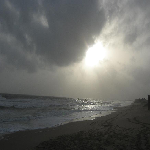

In [ ]:
#Some example (they must not be the same)
#images_in_error_CNN[3]
#images_in_error_VGG[3]
#images_in_error_EFF[3]

In [ ]:
#BYPASSEABLE Processing into array of values (pixels)

if (model_selectable == "CNN") or(model_selectable == "All") :

  image_array_CNN=[]

  for files_wrong in images_in_error_CNN:
    image_arr_CNN = keras.preprocessing.image.img_to_array(files_wrong) # converts to float by default (or set dtype='int')
    image_arr_CNN = np.array([image_arr_CNN])  # Convert single image to a batch (add one dimension)
    image_array_CNN.append(image_arr_CNN)


if (model_selectable == "VGG") or(model_selectable == "All") :

  image_array_VGG=[]

  for files_wrong in images_in_error_VGG:
    image_arr_VGG = keras.preprocessing.image.img_to_array(files_wrong) # converts to float by default (or set dtype='int')
    image_arr_VGG = np.array([image_arr_VGG])  # Convert single image to a batch (add one dimension)
    image_array_VGG.append(image_arr_VGG)


if (model_selectable == "Efficient") or(model_selectable == "All") :

  image_array_EFF=[]

  for files_wrong in images_in_error_EFF:
    image_arr_EFF = keras.preprocessing.image.img_to_array(files_wrong) # converts to float by default (or set dtype='int')
    image_arr_EFF = np.array([image_arr_EFF])  # Convert single image to a batch (add one dimension)
    image_array_EFF.append(image_arr_EFF)


#print (image_array_VGG[1])

In [ ]:
#BYPASSEABLE And finally makes OTHER prediction

if (model_selectable == "CNN") or(model_selectable == "All") :

  img_preds_CNN=[]
  count=0
  for img_arr in image_array_CNN:
    img_preds_CNN.append(best_modelCNN.predict(img_arr))
    print(img_preds_CNN[count])
    count+=+1

if (model_selectable == "VGG") or(model_selectable == "All") :

  img_preds_VGG=[]
  count=0
  for img_arr in image_array_VGG:
    img_preds_VGG.append(best_modelVGG.predict(img_arr))
    print(img_preds_VGG[count])
    count+=+1
  
if (model_selectable == "Efficient") or(model_selectable == "All") :

  img_preds_EFF=[]
  count=0
  for img_arr in image_array_EFF:
    img_preds_EFF.append(best_modelEFF.predict(img_arr))
    print(img_preds_EFF[count])
    count+=+1



In [ ]:
# create figure
fig = plt.figure(figsize=(20, 14))
  
# setting values to rows and column variables
columns = 4

if (model_selectable == "CNN") or(model_selectable == "All") :
  jj=len(images_in_error_CNN)
  rows_CNN=jj//columns

if (model_selectable == "VGG") or(model_selectable == "All") :
  jj=len(images_in_error_VGG)
  rows_VGG=jj//columns

if (model_selectable == "Efficient") or(model_selectable == "All") :
  jj=len(images_in_error_EFF)
  rows_EFF=jj//columns



---------- original 
# reading images
cuentalavieja=1
plot_img=[]

for files_wrong in images_in_error:
  plot_img.append(files_wrong)

  fig.add_subplot(rows+1, columns, cuentalavieja)
  # showing image
  plt.imshow(files_wrong)
  plt.axis('off')
  plt.title('REAL: '+clases[y_test[error_position[cuentalavieja-1]]]+ ' / PRED:' + clases[y_pred[error_position[cuentalavieja-1]]])  
  cuentalavieja+=1
  


<Figure size 1440x1008 with 0 Axes>

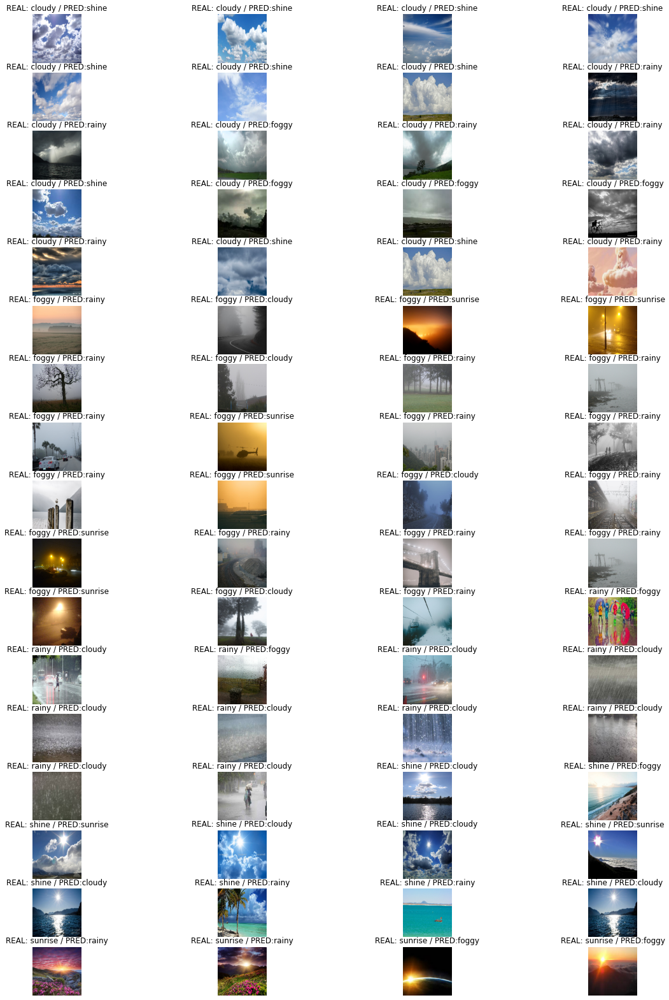

In [ ]:
# CNN PLOTS
# reading images

fig = plt.figure(figsize=(20, 30))

cuentalavieja=1
plot_img_CNN=[]

if (model_selectable == "CNN") or(model_selectable == "All") :
  for files_wrong in images_in_error_CNN:
    plot_img_CNN.append(files_wrong)

    fig.add_subplot(rows_CNN+1, columns, cuentalavieja)
    # showing image
    plt.imshow(files_wrong)
    plt.axis('off')
    plt.title('REAL: '+clases[y_test[error_position_CNN[cuentalavieja-1]]]+ ' / PRED:' + clases[y_pred_CNN[error_position_CNN[cuentalavieja-1]]])  
    cuentalavieja+=1

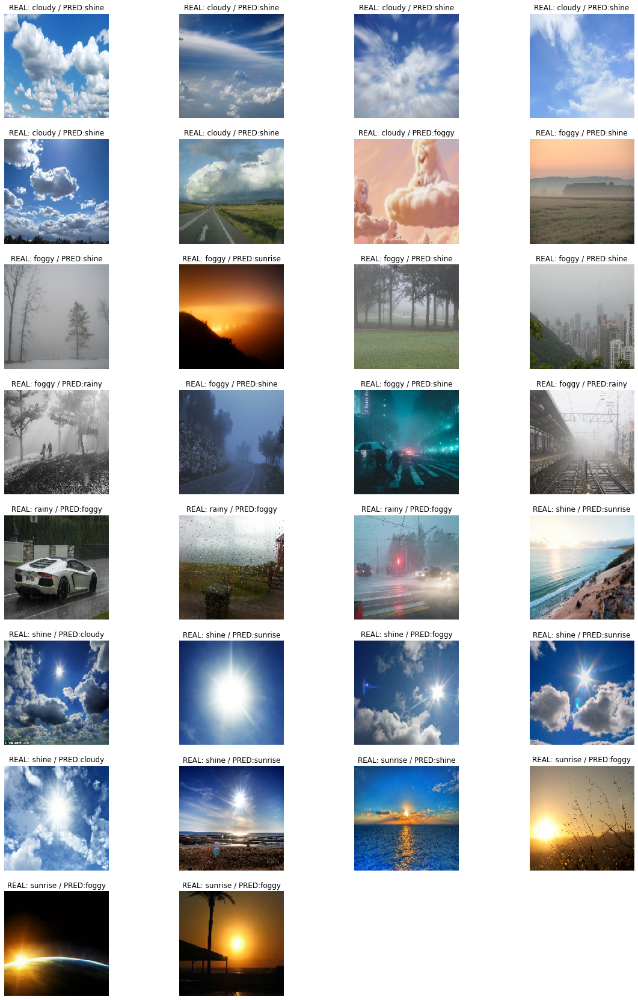

In [ ]:
# VGG PLOTS
# reading images

fig = plt.figure(figsize=(20, 30))

cuentalavieja=1
plot_img_VGG=[]

if (model_selectable == "VGG") or(model_selectable == "All") :
  for files_wrong in images_in_error_VGG:
    plot_img_VGG.append(files_wrong)

    fig.add_subplot(rows_VGG+1, columns, cuentalavieja)
    # showing image
    plt.imshow(files_wrong)
    plt.axis('off')
    plt.title('REAL: '+clases[y_test[error_position_VGG[cuentalavieja-1]]]+ ' / PRED:' + clases[y_pred_VGG[error_position_VGG[cuentalavieja-1]]])  
    cuentalavieja+=1

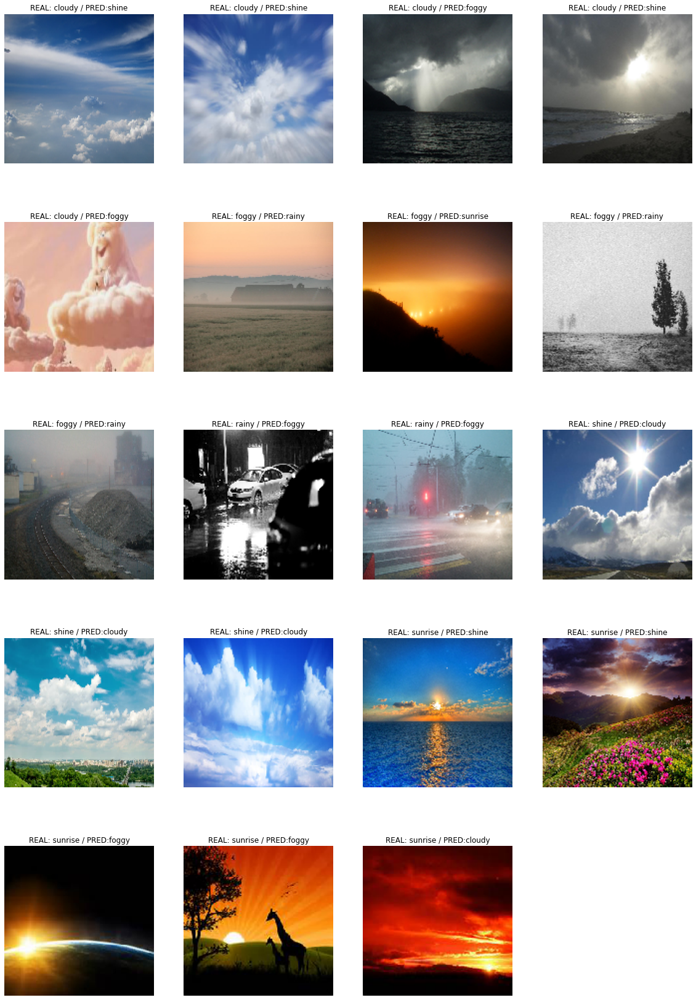

In [ ]:
# EFF PLOTS
# reading images

fig = plt.figure(figsize=(20, 30))

cuentalavieja=1
plot_img_EFF=[]

if (model_selectable == "Efficient") or(model_selectable == "All") :
  for files_wrong in images_in_error_EFF:
    plot_img_EFF.append(files_wrong)

    fig.add_subplot(rows_EFF+1, columns, cuentalavieja)
    # showing image
    plt.imshow(files_wrong)
    plt.axis('off')
    plt.title('REAL: '+clases[y_test[error_position_EFF[cuentalavieja-1]]]+ ' / PRED:' + clases[y_pred_EFF[error_position_EFF[cuentalavieja-1]]])  
    cuentalavieja+=1

---
